In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time as python_time
from matplotlib import cm
from pprint import pprint
from matplotlib.animation import FuncAnimation    
from scipy.interpolate import lagrange 
from IPython.display import HTML
from collections import namedtuple
from IPython.display import clear_output, display


In [2]:
def quadrature(n_quadrature_points):
    """
    n_quadrature_points: number of quadrature point on reference interval [0,1]
    Return a touple with quadrature points and their weights
    """
    # exploit numpy Gauss quadrature. This is defined in [-1,1]
    q, w = np.polynomial.legendre.leggauss(n_quadrature_points)
    return (q+1)/2, w/2

def integrate(poly,a,b):
    """
    poly: numpy.polynomial or list of coefficients to be integrate
    [a,b]: interval of integration
    Return the integral of poly over the interval [a,b]
    """
    integral=np.polyint(poly,m=1)
    value=np.polyval(integral,[a,b])
    return value[-1]-value[0]


In [3]:
def lagrange_basis_ref_eval(k,q):
    """
    k: number of basis
    q: where evaluate the basis 
    Return a numpy array with shape (k,q), one row for each basis, and one column for each points
    """
    result=np.zeros((k,len(q)))
    for i in range(k):
        x=np.linspace(0,1,k)
        y = np.zeros_like(x)
        y[i] = 1
        poly = lagrange(x, y) #interpolate lagrange poly in x,y
        result[i,:]=np.polyval(poly,q)
    return result


def lagrange_derivative_basis_ref_eval(k,q,order=1):
    """
    k: number of basis
    q: where evaluate the basis 
    order: select the order-th derivative
    Return a numpy array with shape (k,q), one row for each basis, and one column for each points
    """
    
    result=np.zeros((k,len(q)))
    for i in range(k):
        x=np.linspace(0,1,k)
        y = np.zeros_like(x)
        y[i] = 1
        poly = lagrange(x, y)
        poly1d=np.polyder(poly,order)
        result[i,:]=np.polyval(poly1d,q)
    return result


def mapping(q, i):
    """
    q: mapping codomain
    i: select i-th interval
    Returns the mapping function from [0,1] to T_k := [q[k], q[k+1]]
    """
    assert i < len(q)-1
    assert i >= 0
    return lambda x: q[i]+x*(q[i+1]-q[i])

def mapping_J(q,i):
    """
    q: mapping codomain
    i: select i-th interval
    Returns the [q[k], q[k+1]]
    """
    assert i < len(q)-1
    assert i >= 0
    return (q[i+1]-q[i])

    
def discrete_domain(vertices,degree):
    """
    vertices: numpy array that represent the elements with its vertices
    degree: degree of the local basis
    Return a numpy array with the union of vertices and internal points of the elements
    """
    domain=np.zeros((len(vertices)-1)*degree+1)
    for i in range(len(vertices)-1):
        j=degree*i
        m=j+degree+1
        domain[j:m]=np.linspace(vertices[i],vertices[i+1],degree+1)
    return domain

def flag_add(vertices,error,tetha=0.5,epsilon=0.05,strategy="equilibration"):
    """
    vertices: numpy array that represent the elements with its vertices
    error: numpy array that represent the posteriori error estimation on each element
    Two strategy are available ["equilibration","maximum"].
    
    Coming from the refining algorith of Verthurth, here more detail
    """
    to_mark=max(round(epsilon*len(vertices)),1)
    for i in range(to_mark):
        position =  np.argmax(error)
        error[position]=0
        midpoint=(vertices[position]+vertices[position+1])/2
        vertices=np.insert(vertices,position+1,midpoint)
        
    if strategy=="equilibration":
        Tetha=np.sum(error**2)
        sigma_t=0

        while sigma_t<tetha*Tetha:
            position =  np.argmax(error)
            sigma_t+=error[position]**2
            error[position]=0
            midpoint=(vertices[position]+vertices[position+1])/2
            vertices=np.insert(vertices,position+1,midpoint)
    
    if strategy=="maximum":
        max_error=error[np.argmax(error)]
        for key,value in enumerate(error):
            if value > tetha*max_error:
                error[key]=0
                midpoint=(vertices[key]+vertices[key+1])/2
                vertices=np.insert(vertices,key+1,midpoint)
            
    return vertices

def projection(old_vertices,new_vertices,solution,degree):
    #complete domain with internal points
    old_discrete=discrete_domain(old_vertices,degree)
    new_discrete=discrete_domain(new_vertices,degree)
    N=len(old_vertices)-1
    
    new_solution=np.zeros_like(new_discrete)
    
    for i in range(N): #for each elements in the intervall
        j = i * degree
        m = j+(degree+1)
        mask=np.logical_and(new_discrete[:]>=old_vertices[i],new_discrete[:]<=old_vertices[i+1])
        local_points=old_discrete[j:m] #local domain element with internal points
        local_value=solution[j:m] #value on the local element with internal points
        local_new_points=new_discrete[mask]
        local_new_points_ref=(local_new_points-old_vertices[i])/(old_vertices[i+1]-old_vertices[i])
        y=lagrange_basis_ref_eval(degree+1,local_new_points_ref) #evaluate the solution in the point into the mesh
        new_solution[mask]=np.dot(local_value,y)    
        
    return new_solution

def projection_vertices(old_vertices,new_vertices,solution,degree):
    #complete domain with internal points
    old_discrete=discrete_domain(old_vertices,degree)
    N=len(old_vertices)-1
    
    new_solution=np.zeros_like(new_vertices)
    
    for i in range(N): #for each elements in the intervall
        j = i * degree
        m = j+(degree+1)
        mask=np.logical_and(new_vertices[:]>=old_vertices[i],new_vertices[:]<=old_vertices[i+1])
        local_points=old_discrete[j:m] #local domain element with internal points
        local_value=solution[j:m] #value on the local element with internal points
        local_new_points=new_vertices[mask]
        local_new_points_ref=(local_new_points-old_vertices[i])/(old_vertices[i+1]-old_vertices[i])

        y=lagrange_basis_ref_eval(degree+1,local_new_points_ref) #evaluate the solution in the point into the mesh
        new_solution[mask]=np.dot(local_value,y)    
    return new_solution

def exact_derivative_vertices(solution,vertices,degree,order=1):
    discrete_omega=discrete_domain(vertices,degree)
    derivative_element=namedtuple("derivative_element",["sx","dx"])
    derivative=[]
    
    N=len(vertices)-1
    for i in range(N): #for each elements in the intervall
        j = i * degree
        m = j+(degree+1)
        local_points=discrete_omega[j:m] #local domain element with internal points
        local_value=solution[j:m] #value on the local element with internal points
        local_new_points_ref=(local_points-vertices[i])/(vertices[i+1]-vertices[i])
        y=lagrange_derivative_basis_ref_eval(degree+1,local_new_points_ref,order) #evaluate the solution in the point into the mesh
        derivative_local=np.dot(local_value,y) /((vertices[i+1]-vertices[i])**order)
        derivative.append(derivative_element(derivative_local[0],derivative_local[-1]))

    return derivative

## Auxiliary function examples and setup
### Lagrange local basis
The function `lagrange_basis_ref_eval` builds a base of size `k` and evaluate on a given set of points. Same with the `lagrange_derivative_basis_ref_eval` function, here we can specify the order of the derivative. 

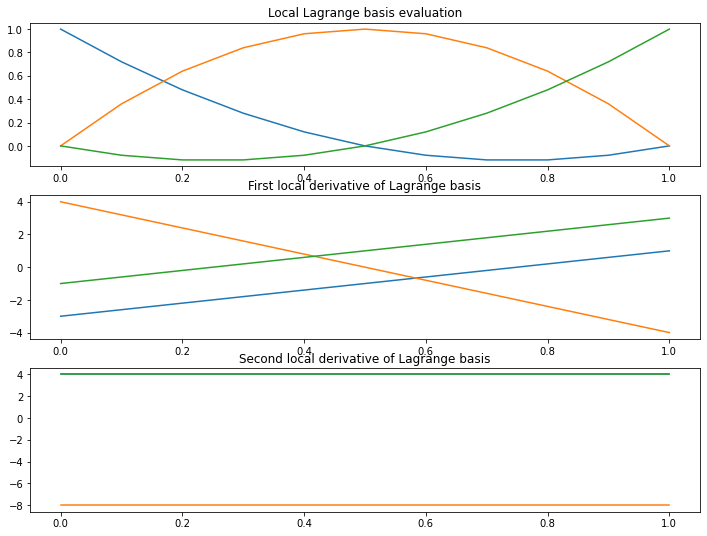

In [4]:
q=np.linspace(0,1,11)
n_basis=3
order=1 #order of derivative ! 

fig, ax = plt.subplots(3, 1)
fig.set_size_inches(12,9)

res=lagrange_basis_ref_eval(n_basis,q)
ax[0].plot(q,res.T)
ax[0].set_title("Local Lagrange basis evaluation")

res=lagrange_derivative_basis_ref_eval(n_basis,q,order)
ax[1].plot(q,res.T)
ax[1].set_title("\nFirst local derivative of Lagrange basis")

res=lagrange_derivative_basis_ref_eval(n_basis,q,order+1)
ax[2].plot(q,res.T)
_ = ax[2].set_title("\nSecond local derivative of Lagrange basis")


### Domain: vertices and internal element points
The domain is represented by the set of vertices, but the solution, in case of *fem order* $\geq$ 2, is delivered also in other internal points (used as quadrature points), is usefull transform a set of vertices in the whole set of evaluation point of the solution. The function `discrete_domain` do exactly this.


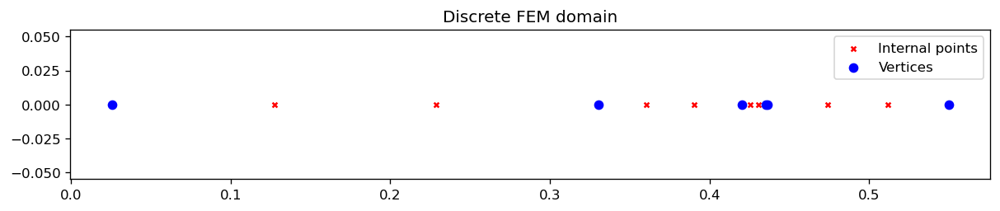

In [5]:
np.random.seed(2)
N=5
degree=3
vertices=(np.random.rand(N+1))
vertices.sort()
domain=discrete_domain(vertices,degree)

plt.figure(figsize=(12, 2), dpi=120)
plt.scatter(domain,np.zeros_like(domain),marker='x',color='red',label='Internal points',s=12)
plt.scatter(vertices,np.zeros_like(vertices),marker='o',color='blue',label='Vertices')
plt.legend()

_ = plt.title("Discrete FEM domain")

### Projection of FEM solution across different spaces
The adaptive method and time marching approach, need a method to project across different discretization the solution. 
Given a solution $u^{n}_{\tau_n}$ (step $n$ on discretization $\tau_n$), we need to find the representation of $u^n$ in $\tau_{n+1}$ i.e. $u_{\tau_{n+1}}^n$.

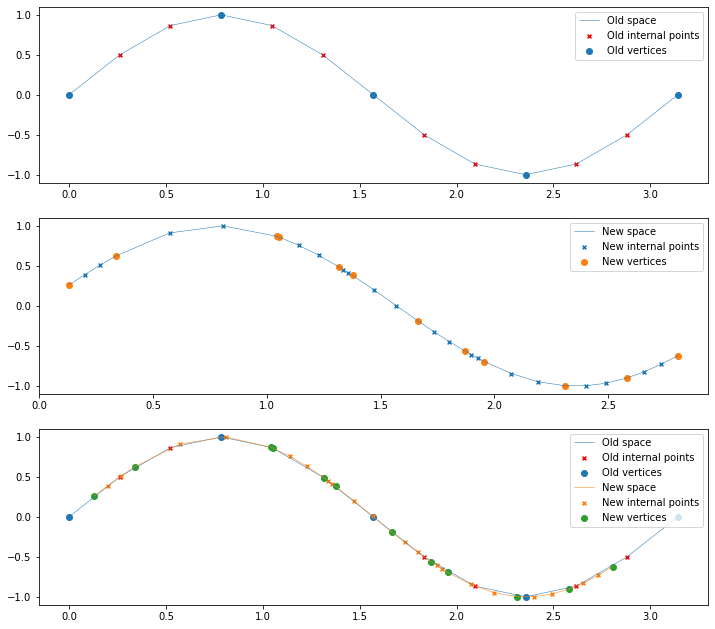

In [6]:
N=5
N_new=12
degree=3

np.random.seed(6)

fig, ax = plt.subplots(3, 1)
fig.set_size_inches(12,11)

x=np.linspace(0,np.pi,N)
x_new=(np.random.rand(N_new))*np.pi
x_new.sort()
domain=discrete_domain(x,degree)
domain_new=discrete_domain(x_new,degree)

y=np.sin(2*x)
y_complete=np.sin(2*domain)

ax[0].plot(domain,y_complete,label="Old space",linewidth=0.5)
ax[0].scatter(domain,y_complete,marker='x',color="red",s=15,label="Old internal points")
ax[0].scatter(x,y,label="Old vertices")
ax[0].legend()

y_complete_new=projection(x,x_new,y_complete,degree)
y_new=projection_vertices(x,x_new,y_complete,degree)

ax[1].plot(domain_new,y_complete_new,label="New space",linewidth=0.5)
ax[1].scatter(domain_new,y_complete_new,marker='x',s=15,label="New internal points")
ax[1].scatter(x_new,y_new,label="New vertices")
ax[1].legend()

ax[2].plot(domain,y_complete,label="Old space",linewidth=0.5)
ax[2].scatter(domain,y_complete,marker='x',color="red",s=15,label="Old internal points")
ax[2].scatter(x,y,label="Old vertices")
ax[2].plot(domain_new,y_complete_new,label="New space",linewidth=0.5)
ax[2].scatter(domain_new,y_complete_new,marker='x',s=15,label="New internal points")
ax[2].scatter(x_new,y_new,label="New vertices")
_  = ax[2].legend()


### Local derivative of FEM solution 
To develop adaptive method (either in time or space), the computation of local derivative arise. The solution is continuous in the vertices, but not differentiable. Then on each element we can define a local derivative. 
Each vertices has a **jump**. This jump is foundamental to calculate a posteriori error.

**Comments:** the derivative on the whole single elements is constant in case of `degree=1`

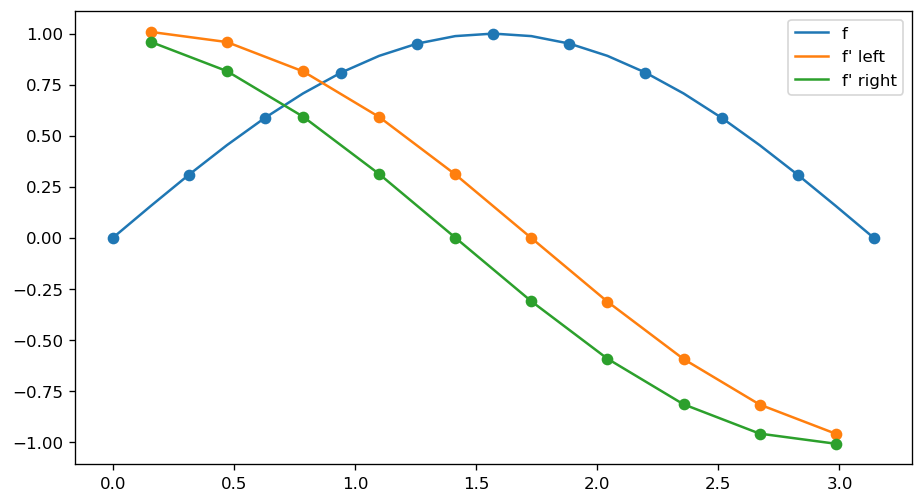

In [7]:
N=11
degree=2

vertices=np.linspace(0,np.pi,N)
domain=discrete_domain(vertices,degree)
function=np.sin(domain)

y_derivative=exact_derivative_vertices(function,vertices,degree,order=1)

left_derivative=[]
right_derivative=[]
for i in y_derivative:
    left_derivative.append(i.sx)
    right_derivative.append(i.dx)

    
plt.figure(figsize=(9, 5), dpi=120)
plt.plot(domain,function,label="f")
plt.scatter(vertices,np.sin(vertices))

plt.plot(vertices[0:-1]+np.diff(vertices)/2,left_derivative,label="f' left")
plt.scatter(vertices[0:-1]+np.diff(vertices)/2,left_derivative)

plt.plot(vertices[0:-1]+np.diff(vertices)/2,right_derivative,label="f' right")
plt.scatter(vertices[0:-1]+np.diff(vertices)/2,right_derivative)
_ = plt.legend()

### Plain FEM setup
Follow  `FEM1D`, able to solve on a domain $\Omega \subset \mathbb{R}$ a general PDE problem: 
$$\begin{cases}
-au''+bu'+c= f  &  \text{in }\Omega \\
u(0)=e,u(1)=d  &  \text{in }\partial \Omega
\end{cases}$$
Is possible to specify also the degree of local basis function.

In [8]:
def FEM1D(vertices,degree,f,parameters):
    """
    Returns the A matrix and F vector to solve 1D FEM problem. 
    Parameters: (a,b,c) tuple coefficients
    f: force function
    """
    M=len(vertices)-1
    N=M*degree+1
    nq=2*degree+1
    q,w=quadrature(nq)
    a,b,c=parameters
    phi=lagrange_basis_ref_eval(degree+1,q).T
    dphi=lagrange_derivative_basis_ref_eval(degree+1,q).T
    
    A=np.zeros((N,N))
    F=np.zeros((N))
    for i in range(M):
        JxW = mapping_J(vertices,i) * w
        ele_A = np.einsum('qi,qj,q',dphi,dphi,JxW) / mapping_J(vertices,i)**2
        ele_B = -np.einsum('qi,qj,q',dphi,phi,JxW) / mapping_J(vertices,i)
        ele_C = np.einsum('qi,qj,q',phi,phi,JxW) 
        ele_F = np.einsum('qi,q,q',phi,f(mapping(vertices, i)(q)),JxW)
        # Assembly local-to-global
        j = i * degree
        m = j+(degree+1)
        A[j:m,j:m] += ele_A*a + ele_B*b +ele_C*c
        F[j:m] += ele_F
    return A,F

def plot_solution(vertices,degree,u,exact=None):
    """
    Plot and visualize the discrete solution, with exact if given.
    """
    discrete_omega=discrete_domain(vertices,degree)
    plt.figure(figsize=(15,7))
    plt.plot(discrete_omega,u,label="discrete")
    if exact is not None:
        xx=np.linspace(vertices[0],vertices[-1],1001)
        plt.plot(xx,exact(xx),label="exact")
    plt.scatter(discrete_omega,np.zeros_like(discrete_domain(vertices,degree)),s=3.5)
    plt.scatter(vertices,np.zeros_like(vertices),color='red',s=3.5,label="vertices")
    for key,value in enumerate(discrete_omega):
        plt.plot([value,value],[0,u[key]],linewidth=0.3,color="black",linestyle="dashed")
    plt.legend()
    plt.show()  

def true_error_L2(vertices,solution,degree,exact):
    """
    Given solution and exact, calculate the L2 error for each Finite Element
    """
    if exact is None:
        return 0
    M=len(vertices) - 1
    true_error=np.zeros(M)
    discrete_omega=discrete_domain(vertices,degree)
    for i in range(M):
        j = i * degree
        m = j+(degree+1)
        local_points=discrete_omega[j:m]
        local_f=exact(local_points)
        true_error[i]=np.trapz(x=local_points,y=(local_f-solution[j:m])**2)#+np.gradient(local_f-solution[j:m])**2
        
    return true_error

Solve a **convection-diffusion** problem with $a,b>0$:
  $$\begin{cases}
	-au''+bu'= 0  &  \text{in }\Omega=(0,1) \\
	u(0)=0 \quad u(1)=1
\end{cases}$$
The problem has an exact solution:
$$ u(x)=\frac{e^{b/ax}-1}{e^{b/a}-1}$$
In case of linear FEM (`degree` 1), with the same matrix of centered finite difference, the discrete solution is:

$$ U_j=\frac{1-\left( \frac{1+Pe_h}{1-Pe_h} \right)^j}{1-\left( \frac{1+Pe_h}{1-Pe_h} \right)^N}$$

$Pe_h$ is the mesh Peclet number, is defined as $Pe_h=\frac{bh}{2a}$.In the continuos problem the Peclet number is defined as $Pe=\frac{bL}{2a}$, it give a measure of the amount of convection and diffusion. The solution if $Pe_h > 1$ is monotonic, and we are in diffussive dominated regime, if $Pe_h<1$ we are in convection dominated regime and the solution is not anymore monotonic. 

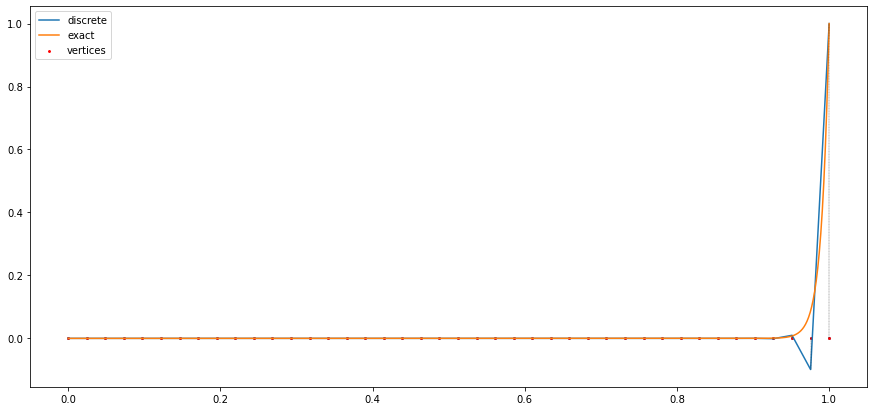

max error 0.1861470268340863
2-norm error 0.18616682323706188
L2 error max 0.0005976444033897744
L2 error 2-norm 0.00042262710556933926


In [9]:
def apply_boundary(A,F):
    """
    Useful function to apply boundary condition to A and F
    """
    A[0,:]=0
    A[0,0]=1
    A[-1,:]=0
    A[-1,-1]=1

    F[0]=0
    F[-1]=1
    
    #Method of Manufactured Solution
    #F[0]=-np.exp(-omega[0]**2)
    #F[-1]=-np.exp(-omega[-1]**2)
    return A,F

omega=[0,1]
degree = 1
M=41

a=0.01
b=1
c=0


######################################################
omega=[0,1]
f=lambda x : np.zeros_like(x)
exact= lambda x : (np.exp((b/a)*x)-1)/(np.exp(b/a)-1)
######################################################

#########################################################
#Method of Manufactured Solutions

#omega=[-4,4]
#f=lambda x : -2*(-2*np.exp(-x**2)*(x**2)+np.exp(-x**2))
#exact=lambda x : -np.exp(-x**2)
#########################################################

vertices=np.linspace(omega[0],omega[1],M+1)
A,F=FEM1D(vertices,degree,f,(a,b,c))
A,F=apply_boundary(A,F)

u=np.linalg.solve(A,F)

plot_solution(vertices,degree,u,exact)
true_error=true_error_L2(vertices,u,degree,exact)
discrete_omega=discrete_domain(vertices,degree)

print(f"max error {np.max(np.abs(exact(discrete_omega)-u))}")
print(f"2-norm error {np.linalg.norm(exact(discrete_omega)-u)}")
print(f"L2 error max {np.linalg.norm(true_error)}")
print(f"L2 error 2-norm {np.max(np.abs(true_error))}")

**Comments:** The solution is not monotone as expected, but has oscillation. In order to remove the oscillation, we can add artificial diffusion, setting up an upwind method with FD scheme, increase the `degree` with FEM or refine the mesh, possibly only where is needed, in order to save computational power.

If we set $a=0$, we end up in a hyperbolic problem, a simple transport problem. In order to solve it, we cannot set the boudary condition on the left and right side of the domain, but only in the *inlet*/*outlet* part, depending on the sign of $b$ and the problem physics.

## Posteriori error estimator
Use the posteriori error estimator for elliptic problem, as explained in Verfurth:
$$ \eta_K^2=h^2_k\lVert f+a\Delta u -b\nabla u -cu \rVert^2_K+\frac{1}{2}\sum_{E\in\partial K}h_k\lVert\mathbb{J}(\textbf{n}_E\cdot \nabla u) \rVert^2_k$$
This quantity is defined for each elemente $k\in T$.
Given $\eta_K$ the error indicators, we must adopt a strategy to mark and refine the mesh where needed. Exists also the possibility to raise the degree on the element. The first solution (**mesh refinement**) is selected.  Two possible strategy are available: **maximum strategy** and **Equilibration strategy**.

### Jump operator
For each edge $E$ of a single element $K$, we arbitrary chose a normal $\textbf{n}_E$ s.t. it point to the exterior of of $K$. And then define:
$$\mathbb{J}(v)(x)=\lim_{t\rightarrow 0+} v(x-t\textbf{n}_E)-\lim_{t\rightarrow 0+} v(x+t\textbf{n}_E) $$

### Maximum strategy
Given the partition $T$, the error indicator $\eta_K$ and a threshold $\theta\in (0,1)$, we want to select a subset of elements to refine. 
- Compute $\eta_{max}=\max_K \eta_K$

- If $\eta_K \geq \theta\eta_{max}$ refine the element $K$

### Equilibration strategy
Search for a subset $\tilde{T}$ of element to refine.

First:
- Compute $\Theta_T=\sum_K\eta_K^2$,set $\sum_K=0$ and $\tilde{T}=\{\}$

Iterate:
- If $\sum_K \geq \theta\Theta_T$ return $\tilde{T}$ and stop.

- Compute $\tilde{\eta}_T=\max_{K\in T-\tilde{T}}\eta_K$

- For all elements $K\in T-\tilde{T}$ check if $\eta_K=\tilde{\eta}_K$ , if true move element $K$ from $T$ to $\tilde{T}$ and add $\eta_K$ to $\sum_K$

At the end we get:
$ \sum_{K\in\tilde{T}} \eta^2_K \geq \theta \sum_{K\in T}\eta^2_K$
As explained in Verfurth in some problem (e.g. convection dominated problems) few elements have a large amount of error, and the $\tilde{T}$ partition contain only few elements with large error, and there is no way to refine mesh with medium amount of error. To avoid this problem we can select $\epsilon$ small $[0.05-0.1]$, mark first $\epsilon \%$ elements with the largest estimated error, and then proceed with the usual algorithms, popular value of $\theta$ are usually $0.5$. In this way the few elements with the largest elements don't bias the refinement algorithms

In [10]:
def posteriori_error(solution,vertices,degree,f,parameters):
        a,b,c=parameters
        M=len(vertices) -1 
        h=np.diff(vertices)
        discrete_omega=discrete_domain(vertices,degree)
        derivative_2=exact_derivative_vertices(solution,vertices,degree) #this list contain the derivative of the solution on the left and right vertices ! 
        nq=2*degree+1
        q,w=quadrature(nq)
        phi=lagrange_basis_ref_eval(degree+1,q).T
        dphi=lagrange_derivative_basis_ref_eval(degree+1,q,1).T
        ddphi=lagrange_derivative_basis_ref_eval(degree+1,q,2).T
        
        jump=np.zeros(M)
        jump[0]=derivative_2[0].dx-derivative_2[1].sx
        jump[-1]=+derivative_2[-1].sx-derivative_2[-2].dx
        for i in range(1,len(jump)-1,1):
            jump[i]=np.abs(derivative_2[i].sx-derivative_2[i-1].dx)+np.abs(derivative_2[i].dx-derivative_2[i+1].sx)
            
        
        #jump=np.zeros(M)
        #jump[0]=derivative_2[0].dx-derivative_2[1].sx
        #jump[-1]=-derivative_2[-1].sx+derivative_2[-2].dx
        #for i in range(1,len(jump)-1,1):
        #    jump[i]=-derivative_2[i].sx+derivative_2[i].dx+derivative_2[i-1].dx-derivative_2[i+1].sx
        #jump=np.abs(jump)**2    
        
        
        
        interior=np.zeros(M)
        for i in range(M):
            j = i * degree
            m = j+(degree+1) 
            local_points=discrete_omega[j:m]
            JxW = mapping_J(vertices,i) * w
            
            ele_F = np.einsum('q,q',f(mapping(vertices, i)(q)),JxW)
            interior[i]=ele_F
            #print(f"quadrature {ele_F}")
            #print(f"approx {np.trapz(local_points,f(local_points))}\n")
            local_value=solution[j:m] #value on the local element with internal points
            interior[i]+=a*np.einsum('q,q',np.dot(ddphi,local_value),JxW)/((vertices[i+1]-vertices[i])**2)
            interior[i]-=b*np.einsum('q,q',np.dot(dphi,local_value),JxW)/((vertices[i+1]-vertices[i]))
            interior[i]-=c*np.einsum('q,q',np.dot(phi,local_value),JxW)     
            
        error=np.sqrt((h**2)*(interior**2)+0.5*h*(jump**2))
        return error

def adaptive_FEM1D(vertices,M_final,degree,f,parameters,boundary_function,exact=None):
    """
    Solve a PDE using posteriori error estimator, save each single step using a named tuple.
    """
    single_step=namedtuple("single_step",["vertices","discrete_omega","solution","exact","true_error","estimator"])
    
    M=len(vertices)-1
    N=M*degree+1
    nq=2*degree+1
    q,w=quadrature(nq)
    result=[]
    while M < M_final:
        A,F=FEM1D(vertices,degree,f,parameters)
        A,F=boundary_function(A,F)
        u=np.linalg.solve(A,F)
        discrete_omega=discrete_domain(vertices,degree)
        error=posteriori_error(u,vertices,degree,f,parameters)
        true_error=np.empty(1)
        if exact is not None:
            true_error=true_error_L2(vertices,u,degree,exact)         
        result.append(single_step(vertices.copy(),discrete_omega.copy(),u.copy(),exact,true_error.copy(),error.copy()))
        vertices=flag_add(vertices,error,tetha=0.5,epsilon=0.1,strategy="maximum")
        M=len(vertices) - 1
        N=M*degree+1
    return result


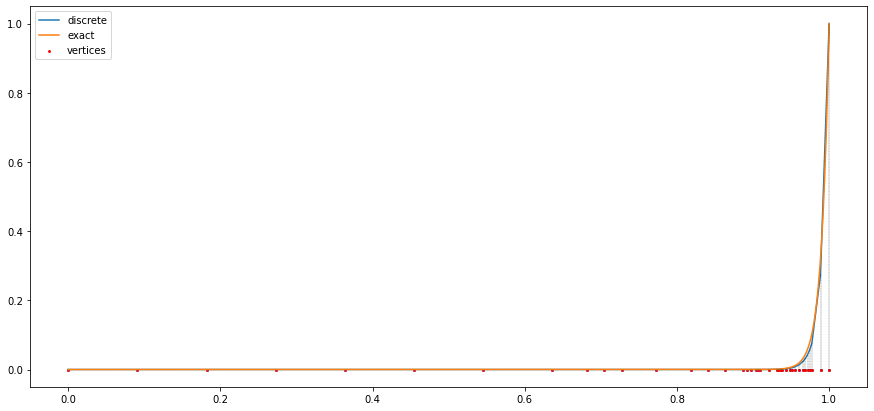

max error 0.045621798308160266
2-norm error 0.06127778564472346
L2 error max 2.0024595760262595e-05
L2 error 2-norm 1.603145743773891e-05


In [11]:
def apply_boundary(A,F):
    """
    Useful function to apply boundary condition to A and F
    """
    A[0,:]=0
    A[0,0]=1
    A[-1,:]=0
    A[-1,-1]=1

    F[0]=0
    F[-1]=1
    
    #Method of Manufactured Solution
    #F[0]=-np.exp(-omega[0]**2)
    #F[-1]=-np.exp(-omega[-1]**2)
    return A,F

omega=[0,1]
degree = 1
M_init=11
M_final=41

a=0.01
b=1
c=0


######################################################
omega=[0,1]
f=lambda x : np.zeros_like(x)
exact= lambda x : (np.exp((b/a)*x)-1)/(np.exp(b/a)-1)
######################################################

#########################################################
#Method of Manufactured Solutions

#omega=[-4,4]
#f=lambda x : -2*(-2*np.exp(-x**2)*(x**2)+np.exp(-x**2))
#exact=lambda x : -np.exp(-x**2)
#a=1
#b=0
#c=0

#########################################################
vertices=np.linspace(omega[0],omega[1],M_init+1)

result=adaptive_FEM1D(vertices,M_final,degree,f,(a,b,c),apply_boundary,exact)

last_step=result[-1]

plot_solution(last_step.vertices,degree,last_step.solution,exact)
true_error=true_error_L2(last_step.vertices,last_step.solution,degree,exact)
discrete_omega=discrete_domain(last_step.vertices,degree)

print(f"max error {np.max(np.abs(exact(discrete_omega)-last_step.solution))}")
print(f"2-norm error {np.linalg.norm(exact(discrete_omega)-last_step.solution)}")
print(f"L2 error max {np.linalg.norm(true_error)}")
print(f"L2 error 2-norm {np.max(np.abs(true_error))}")

### Adaptive FEM comparison
Follow the solution of the same problem above with the adaptive method and posteriori estimator.

In [12]:
def animation(result):
    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(20,9)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    ax1=ax[1].twinx()

    def animate(i):
        ax[0].clear()
        ax[1].clear()    
        ax1.clear()
        # Get the point from the points list at index i (vertices,discrete_omega,u,exact,true_error)
        vertices=result[i].vertices
        discrete_omega=result[i].discrete_omega
        u=result[i].solution
        exact=result[i].exact
        true_error=result[i].true_error
        estimated_error=result[i].estimator
        # Plot that point using the x and y coordinates
        ax[0].plot(discrete_omega, u,label="discrete",linewidth=0.5)
        ax[0].scatter(vertices,np.zeros_like(vertices),color="red",s=6)
        if exact is not None:
            xx=np.linspace(vertices[0],vertices[-1],301)
            ax[0].plot(xx, exact(xx),label="exact",color="red",linewidth=0.5)
            ax[1].plot(vertices[0:-1]+np.diff(vertices)/2,true_error,label="true error",linewidth=0.5,color="blue")
            #ax1+=ax[1]
        ax1.plot(vertices[0:-1]+np.diff(vertices)/2,estimated_error,label="estimated error",linewidth=0.5,color="red")
        ax1.scatter(vertices[0:-1]+np.diff(vertices)/2,estimated_error,s=2)
        if i>0:
            vertices=result[i-1][0]
        ax[0].scatter(vertices,np.zeros_like(vertices),color="blue",s=6,marker="x")
        ax1.plot(np.nan ,label="true error",linewidth=0.5,color="blue")
        ax1.legend()
        ax[0].legend()
        
    ani = FuncAnimation(fig, animate, frames=len(result),
                        interval=500, repeat=False)
    plt.close()
    return HTML(ani.to_jshtml())

animation(result)

### Time dependent problems
The previous scheme is modified introducing the dependence over the time, solving a *parabolic* problem, using a fully discrete methods: **FEM** in space and **FD** in time. This is called FEM $\Theta$method. At each time step, we solve the following problem (weak formulation):

$$ \frac{1}{\Delta t}(u_{h}^{n+1}-u_{h}^{n},v)+A(\Theta u_{h}^{n+1}+(1-\Theta)u_{h}^{n},v)=(\Theta f(t_{n+1})+(1-\Theta)f(t_n),v)\quad\forall v \in V_h^k$$


In [13]:
def apply_boundary(A,F):
        A[0,:]=0
        A[0,0]=1
        A[-1,:]=0
        A[-1,-1]=1
        F[0]=0
        F[-1]=0
        #F[0]=-np.exp(-omega[0]**2)
        #F[-1]=-np.exp(-omega[-1]**2)
        return A,F

omega=[0,1]
degree = 1
M=81
N=M*degree+1
nq=2*degree+1


time_step=150
k=0.05

a=0.01
b=0.1
c=0.5

#theta=0 explicit euler
#theta=1 implicit euler
#theta=0.5 CN
theta=1

vertices=np.linspace(omega[0],omega[1],M+1)
discrete_omega=discrete_domain(vertices,degree)
h=np.diff(vertices)
#f=lambda x,t : np.zeros_like(x)

def f(x,t):
    speed=0.3
    position=t*speed
    mask=np.logical_and(x[:]>position-1E-2,x[:]<position+1E-2)
    x=np.zeros_like(x)
    if t>0:
        x[mask]=10
    return x

start_time=python_time.time()
q,w=quadrature(nq)
phi=lagrange_basis_ref_eval(degree+1,q).T
dphi=lagrange_derivative_basis_ref_eval(degree+1,q).T
A=np.zeros((N,N))
F=np.zeros((N))
TT=np.zeros((N,N))

for i in range(M):
    JxW = mapping_J(vertices,i) * w
    ele_A = np.einsum('qi,qj,q',dphi,dphi,JxW) / mapping_J(vertices,i)**2
    ele_B = -np.einsum('qi,qj,q',dphi,phi,JxW) / mapping_J(vertices,i)
    ele_C = np.einsum('qi,qj,q',phi,phi,JxW) 
    ele_F = np.einsum('qi,q,q',phi,f(mapping(vertices, i)(q),0),JxW)
    # Assembly local-to-global
    j = i * degree
    m = j+(degree+1)
    A[j:m,j:m]+=ele_A*a+ele_B*b+ele_C*c
    F[j:m] += ele_F
    TT[j:m,j:m]+= ele_C
    
AA=theta*A*k+TT
AA,_=apply_boundary(AA,[0])

#Initial conditions
u0=f(discrete_omega,0)

u1=u0
result=[]
result.append((u1,discrete_omega))
for time in range(time_step):
    F=np.zeros((N))
    clear_output(wait=True)
    print(f"Progress {round(100*time/time_step,1)}%")
    for i in range(M):
        JxW = mapping_J(vertices,i) * w
        ele_F = np.einsum('qi,q,q',phi,f(mapping(vertices, i)(q),time*k)*(1-theta)+f(mapping(vertices, i)(q),(time+1)*k)*theta,JxW)
        # Assembly local-to-global
        j = i * degree
        m = j+(degree+1)
        F[j:m] += ele_F
    
    bb=-k*(1-theta)*np.dot(A,u1)+np.dot(TT,u1)+k*F
    bb[0]=0
    bb[-1]=0
    u=np.linalg.solve(AA,bb)
    u1=u.copy()
    result.append((u,discrete_omega))
end_time=python_time.time()
clear_output(wait=True)
print(f"Courant number {round(np.max(k/(h**2)),2)}")
print(f"a*mu= {round(a*np.max(k/(h**2)),2)}")
print(f"Done!!!\nexecution time: {end_time-start_time} s")

Courant number 328.05
a*mu= 3.28
Done!!!
execution time: 2.7715485095977783 s


In [14]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(18,9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

def animate(i):
    ax.clear()
    ax.set_ylim(-0.1, 1.1)    
    u=result[i][0]
    discrete=result[i][1]
    ax.plot(discrete,u,label="discrete plain")   
    ax.scatter(discrete_omega,np.zeros_like(discrete_omega),s=2)
    ax.legend()
    clear_output(wait=True)
    print(f"Progress {round(100*i/len(result),1)}%")
    
ani = FuncAnimation(fig, animate, frames=len(result),
                    interval=500, repeat=False)
plt.close()

matplotlib.rcParams['animation.embed_limit'] = 2**128
HTML(ani.to_jshtml())


Progress 99.3%


In [15]:
from copy import deepcopy
result_plain=deepcopy(result)

**Comments**: setting `theta` to 1, we have implicit euler and a stable and monotone solution unconditionally, with `theta` equalt to $\frac{1}{2}$ we have CN scheme and a second order accuracy in time, but not a monotone solution. Some oscillation could be observed with $\Delta t=0.1$ and $M=341$, the result is an extremly high courant number. 
A possible improvement of the problem could be the use of **2nd order BDF** time formula, modifing the discrete time operator. 

### Time dependent problem and adaptive scheme.
The time dependent adaptive scheme take into account 2 error estimator, the **temporal** (parabolic error) and **spatial** (elliptic) error. At each time step the problem is solved many times, starting with an equispaced mesh grid, and then following the stategies explained above and the new estimator the mesh is *refined*. Between subsequent time step we have different meshes (define $T^n$ the mesh at the step $n$, we end up with an ordered sequence of mesh $[\dots,T^{n-1},T^{n},T^{n+1},\dots ]$) and follow that $U^n$ is evaluated in the mesh $T^n$. Since $U^{n-1}$ is necessary in order to calculate $U^n$, at each iteration of the adaptive phase we project $U^{n-1}$ in $T^n$.
#### More in error estimation.
The spatial error indicator is similar to the previous one, but take into account new terms. We have then the element residual and the face residual. For the element residual we use the $L^2$ norm.
#### Spatial residual 
In the internal points of the elements we compute:

$$R_K=f-\frac{1}{\Delta T} (U^{n}_{T^{n}}-U^{n-1}_{T^{n-1}})+a\Delta U^{n}_{T^n}-b\nabla U^{n}_{T^n} -c U^{n}_{T^n}$$

In the face of the elements, we use the jump operator:

$$ R_E=\mathbb{J}_E({n}_E\cdot\nabla U_{T^n}^n)$$

Then we can define the spatial error indicator:

$${\eta_{T^n}^{n}}^2=\sum_K h^2_K \lVert R_K \rVert^2_K+\sum_E h_E \lVert R_E \rVert_E^2 $$

#### Temporal residual 
The temporal residual is defined as:

$${\tilde{\eta}_{T^n}^{n}}^2=\sum_Kh^2_K\lVert a\nabla (U^{n}_{T^{n}}-U^{n-1}_{T^{n-1}})+a\Delta U_{T^n}^n-b U_{T^n}^n \rVert_K^2+\sum_E h_e \lVert \mathbb{J}_E(n_e\cdot\nabla U_{T^n}^n) \rVert_E^2$$

In [16]:
    
def posteriori_error_temporal(solution,solution_old,vertices,degree,f,parameters,current_time,k):
        a,b,c=parameters
        M=len(vertices) -1 
        h=np.diff(vertices)
        discrete_omega=discrete_domain(vertices,degree)
        derivative_2=exact_derivative_vertices(solution,vertices,degree) #this list contain the derivative of the solution on the left and right vertices ! 
        nq=2*degree+1
        q,w=quadrature(nq)
        phi=lagrange_basis_ref_eval(degree+1,q).T
        dphi=lagrange_derivative_basis_ref_eval(degree+1,q,1).T
        ddphi=lagrange_derivative_basis_ref_eval(degree+1,q,2).T
        
        jump=np.zeros(M)
        jump[0]=derivative_2[0].dx-derivative_2[1].sx
        jump[-1]=+derivative_2[-1].sx-derivative_2[-2].dx
        for i in range(1,len(jump)-1,1):
            jump[i]=np.abs(derivative_2[i].sx-derivative_2[i-1].dx)+np.abs(derivative_2[i].dx-derivative_2[i+1].sx)
         
        interior=np.zeros(M)
        for i in range(M):
            j = i * degree
            m = j+(degree+1) 
            local_points=discrete_omega[j:m]
            JxW = mapping_J(vertices,i) * w
            #f component, integrated with quadrature rule
            ele_F = np.einsum('q,q',f(mapping(vertices, i)(q),current_time*k),JxW)
            interior[i]=ele_F
            #print(f"quadrature {ele_F}")
            #print(f"approx {np.trapz(local_points,f(local_points))}\n")
            local_value=solution[j:m] #value on the local element with internal points
            interior[i]+=a*np.einsum('q,q',np.dot(ddphi,solution[j:m]),JxW)/((vertices[i+1]-vertices[i])**2)
            interior[i]-=b*np.einsum('q,q',np.dot(dphi,solution[j:m]),JxW)/((vertices[i+1]-vertices[i]))
            interior[i]-=c*np.einsum('q,q',np.dot(phi,solution[j:m]),JxW)   
            interior[i]-=c*np.einsum('q,q',np.dot(phi,solution[j:m]-solution_old[j:m]),JxW)/k
            
        error_spatial=np.sqrt((h**2)*(interior**2)+0.5*h*(jump**2))      
        interior=np.zeros(M)
        for i in range(M):
            j = i * degree
            m = j+(degree+1) 
            local_points=discrete_omega[j:m]
            local_value=solution[j:m] #value on the local element with internal points
            JxW = mapping_J(vertices,i) * w
            interior[i]=b*np.einsum('q,q',np.dot(dphi,solution[j:m]-solution_old[j:m]),JxW)/((vertices[i+1]-vertices[i]))
            interior[i]+=a*np.einsum('q,q',np.dot(ddphi,solution[j:m]),JxW)/((vertices[i+1]-vertices[i])**2)
            interior[i]-=c*np.einsum('q,q',np.dot(phi,solution[j:m]),JxW)   
        error=error_spatial+np.sqrt((h**2)*(interior**2))
        return error

def implicit_1dfem(vertices,f,degree,M,u1,k,parameters,current_time):
    phi=lagrange_basis_ref_eval(degree+1,q).T
    dphi=lagrange_derivative_basis_ref_eval(degree+1,q).T
    a,b,c=parameters
    N=M*degree+1
    AA=np.zeros((N,N))
    F=np.zeros((N))
    TT=np.zeros((N,N))
    for i in range(M):
        JxW = mapping_J(vertices,i) * w
        ele_A = np.einsum('qi,qj,q',dphi,dphi,JxW) / mapping_J(vertices,i)**2
        ele_B = -np.einsum('qi,qj,q',dphi,phi,JxW) / mapping_J(vertices,i)
        ele_C = np.einsum('qi,qj,q',phi,phi,JxW) 
        ele_F = np.einsum('qi,q,q',phi,f(mapping(vertices, i)(q),k*current_time),JxW)
        # Assembly local-to-global
        j = i * degree
        m = j+(degree+1)
        #ok
        AA[j:m,j:m]+=ele_A*a+ele_B*b+ele_C*c
        F[j:m] += ele_F
        TT[j:m,j:m]+= ele_C
    AA=AA*k+TT
    bb=np.dot(TT,u1)+k*F
    return AA,bb

def apply_boundary(A,F):
        A[0,:]=0
        A[0,0]=1
        A[-1,:]=0
        A[-1,-1]=1
        
        F[0]=0
        F[-1]=0
        return A,F

In [17]:

#domain definition
omega=[0,1]

#FEM parameter

degree =1
M_start=41
M_max=81
N=M*degree+1
nq=2*degree+1

time_step=150
k=0.05

a=0.01
b=0.1
c=0.5

parameters=(a,b,c)
vertices=np.linspace(omega[0],omega[1],M+1)
discrete_omega=discrete_domain(vertices,degree)

#RHS 
def f(x,t):
    speed=0.3
    position=t*speed
    mask=np.logical_and(x[:]>position-1E-2,x[:]<position+1E-2)
    x=np.zeros_like(x)
    if t>0:
        x[mask]=10
    return x

q,w=quadrature(nq)
phi=lagrange_basis_ref_eval(degree+1,q).T
dphi=lagrange_derivative_basis_ref_eval(degree+1,q).T

u1=f(discrete_omega,0)
u=np.zeros((N))
result=[]
vertices_new=vertices
start_time=python_time.time()
for j in range(time_step):
    M=M_start
    vertices_new=np.linspace(omega[0],omega[1],M_start+1)
    clear_output(wait=True)
    print(f"Progress {round(100*j/time_step,1)}%")
    while M<M_max:
        u1_projected=projection(vertices,vertices_new,u1,degree)
        AA,bb=implicit_1dfem(vertices_new,f,degree,M,u1_projected,k,parameters,j)
        AA,bb=apply_boundary(AA,bb)
        u=np.linalg.solve(AA,bb)
        error=posteriori_error_temporal(u,u1_projected,vertices_new,degree,f,parameters,j,k)
        vertices_old=vertices_new.copy() #save the space where the solution u is found
        vertices_new=flag_add(vertices_new,error,tetha=0.5,epsilon=0.1,strategy="equilibration")
        M=len(vertices_new) - 1
        N=M*degree+1
    u1=u.copy()
    vertices=vertices_old
    discrete_omega=discrete_domain(vertices_old,degree)
    result.append((u,discrete_omega))
    
end_time=python_time.time()
clear_output(wait=True)
print(f"Done!!!\nexecution time: {end_time-start_time} s")


Done!!!
execution time: 68.86358213424683 s


In [18]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(18,9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

def animate(i):
    ax.clear()
    ax.set_ylim(0, 1.1)    
    u=result[i][0]
    discrete=result[i][1]
    ax.plot(discrete, u,label="discrete")
    ax.scatter(discrete,np.zeros_like(discrete))
    ax.scatter(discrete,u,marker='x',s=5)
    clear_output(wait=True)
    print(f"Progress {round(100*i/len(result),1)}%")
    ax.legend()
ani = FuncAnimation(fig, animate, frames=len(result),
                    interval=500, repeat=False)
plt.close()

HTML(ani.to_jshtml())

Progress 99.3%


In [19]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(18,9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

def animate(i):
    ax.clear()
    ax.set_ylim(0, 1.1)    
    u=result[i][0]
    discrete=result[i][1]
    ax.plot(discrete, u,label="discrete adaptive")
    ax.scatter(discrete,np.zeros_like(discrete))
    #ax.scatter(discrete,u,marker='x',s=5)
    u=result_plain[i][0]
    discrete=result_plain[i][1]
    ax.plot(discrete,u,label="discrete plain")
    clear_output(wait=True)
    print(f"Progress {round(100*i/len(result),1)}%")
    #ax.scatter(discrete,np.zeros_like(discrete))
    #ax.scatter(result_plain[i][1],result_plain[i][0],marker='x',s=5)
    ax.legend()
    
ani = FuncAnimation(fig, animate, frames=len(result),
                    interval=500, repeat=False)
plt.close()

HTML(ani.to_jshtml())

Progress 99.3%
